# Regression Tree - Predicting Prices of Used Cars

This program is a solution to the problem 9.3 of chapter 9 of following book. 

Data Mining for Business Analytics: Concepts, Techniques, and Applications in Python, First Edition.

Galit Shmueli, Peter C. Bruce, Peter Gedeck, and Nitin R. Patel

© 2020 John Wiley & Sons, Inc. Published 2020 by John Wiley & Sons, Inc.

## Chapter 9, Problem 9.3

Predicting Prices of Used Cars (Regression Trees). The file ToyotaCorolla.csv contains the data on used cars (Toyota Corolla) on sale during late summer of 2004 in the Netherlands. It has 1436 records containing details on 38 attributes, including Price, Age, Kilometers, HP, and other specifications. The goal is to predict the price of a used Toyota Corolla based on its specifications. (The example in Section 9.7 is a
subset of this dataset.) Data Preprocessing. Split the data into training (60%), and validation (40%) datasets.
    
    a. Run a full-grown regression tree (RT) with outcome variable Price and predictors Age_08_04, KM, Fuel_Type (first convert to dummies), HP, Automatic, Doors, Quarterly_Tax, Mfr_Guarantee, Guarantee_Period, Airco, Automatic_airco, CD_Player, Powered_Windows, Sport_Model, and Tow_Bar. Set random_state=1.
        i. Which appear to be the three or four most important car specifications for predicting the car’s price?
        ii. Compare the prediction errors of the training and validation sets by examining their RMS error and by plotting the two boxplots. How does the predictive performance of the validation set compare to the training set? Why does this occur?
        iii. How might we achieve better validation predictive performance at the expense of training performance?
        iv. Create a smaller tree by using GridSearchCV() with cv = 5 to find a fine-tuned tree. Compared to the full-grown tree, what is the predictive performance on the validation set?
    b. Let us see the effect of turning the price variable into a categorical variable. First, create a new variable that categorizes price into 20 bins. Now repartition the data keeping Binned_Price instead of Price. Run a classification tree with the same set of input variables as in the RT, and with Binned_Price as the output variable. As in the less deep regression tree, create a smaller tree by using GridSearchCV() with cv = 5 to find a fine-tuned tree.
        i. Compare the smaller tree generated by the CT with the smaller tree generated by RT. Are they different? (Look at structure, the top predictors, size of tree, etc.) Why?
        ii. Predict the price, using the smaller RT and CT, of a used Toyota Corolla with the specifications listed in Table 9.10.    

![alt text](specifications_for_particular_toyota_corolla.png)

        iii. Compare the predictions in terms of the predictors that were used, the magnitude of the difference between the two predictions, and the advantages and disadvantages of the two methods.

## Importing Libraries

In [449]:
import pandas as pd

import sklearn as skl
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier

import dmba
from dmba import plotDecisionTree, regressionSummary

import matplotlib.pyplot as plt

Printing versions of libraries

In [450]:
print('pandas version: {}'.format(pd.__version__))
print('sklearn version: {}'.format(skl.__version__))
print('dmba version: {}'.format(dmba.__version__))

pandas version: 1.5.3
sklearn version: 1.2.1
dmba version: 0.2.4


## Settings Options

In [451]:
# set the option to display all columns
pd.set_option('display.max_columns', None)

## Loading Dataset

In [452]:
df = pd.read_csv('ToyotaCorolla.csv')
df.head(1)

,Id,Model,Price,Age_08_04,Mfg_Month,Mfg_Year,KM,Fuel_Type,HP,Met_Color,Color,Automatic,CC,Doors,Cylinders,Gears,Quarterly_Tax,Weight,Mfr_Guarantee,BOVAG_Guarantee,Guarantee_Period,ABS,Airbag_1,Airbag_2,Airco,Automatic_airco,Boardcomputer,CD_Player,Central_Lock,Powered_Windows,Power_Steering,Radio,Mistlamps,Sport_Model,Backseat_Divider,Metallic_Rim,Radio_cassette,Parking_Assistant,Tow_Bar
0,1,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13500,23,10,2002,46986,Diesel,90,1,Blue,0,2000,3,4,5,210,1165,0,1,3,1,1,1,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0


## Data Preprocessing

Split the data into training (60%), and validation (40%) datasets.

In [453]:
X = df.drop(columns=['Price'])
y = df['Price']
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

## Making Predictions

##### a. Run a full-grown regression tree (RT) with outcome variable Price and predictors Age_08_04, KM, Fuel_Type (first convert to dummies), HP, Automatic, Doors, Quarterly_Tax, Mfr_Guarantee, Guarantee_Period, Airco, Automatic_airco, CD_Player, Powered_Windows, Sport_Model, and Tow_Bar. Set random_state=1.

Specifying predictors and outcomes.

In [454]:
predictors = ['Age_08_04', 'KM', 'Fuel_Type', 'HP', 'Automatic', 'Doors', 'Quarterly_Tax', 'Mfr_Guarantee', 'Guarantee_Period', 'Airco'
              , 'Automatic_airco', 'CD_Player', 'Powered_Windows', 'Sport_Model', 'Tow_Bar']
outcome = 'Price'

Transforming variable fuel type (Fuel_Type) into a categorical variable.

In [455]:
train_X = pd.get_dummies(train_X[predictors], columns=['Fuel_Type'])
valid_X = pd.get_dummies(valid_X[predictors], columns=['Fuel_Type'])

display(train_X.head(1))
display(valid_X.head(1))

,Age_08_04,KM,HP,Automatic,Doors,Quarterly_Tax,Mfr_Guarantee,Guarantee_Period,Airco,Automatic_airco,CD_Player,Powered_Windows,Sport_Model,Tow_Bar,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
1238,75,82256,110,0,3,69,0,3,0,0,0,1,1,0,0,0,1


,Age_08_04,KM,HP,Automatic,Doors,Quarterly_Tax,Mfr_Guarantee,Guarantee_Period,Airco,Automatic_airco,CD_Player,Powered_Windows,Sport_Model,Tow_Bar,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
509,46,53700,97,0,5,85,1,3,0,0,1,1,0,0,0,0,1


Running a full-grown regression tree (RT) with outcome variable Price and given predictors.

In [456]:
regTreeFull = DecisionTreeRegressor()
regTreeFull.fit(train_X, train_y)

plotDecisionTree(regTreeFull, feature_names=train_X.columns)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.955919 to fit


###### i. Which appear to be the three or four most important car specifications for predicting the car’s price?

In [457]:
importances = regTreeFull.feature_importances_
dfImpFullRegTr = pd.DataFrame({'feature': train_X.columns, 'importance': importances})
dfImpFullRegTr = dfImpFullRegTr.sort_values('importance', ascending=False)
print(dfImpFullRegTr.head(3))

     feature  importance
0  Age_08_04    0.834161
2         HP    0.052940
1         KM    0.048076


From above output we can see that three most important car specifications for predicting the car's price are Age_08_04, HP and KM. 

###### ii. Compare the prediction errors of the training and validation sets by examining their RMS error and by plotting the two boxplots. How does the predictive performance of the validation set compare to the training set? Why does this occur?

Predicting the target values for both sets.

In [458]:
train_y_pred = regTreeFull.predict(train_X)
valid_y_pred = regTreeFull.predict(valid_X)

Computing RMS error of the training and validation sets.

In [459]:
regressionSummary(train_y, train_y_pred)
regressionSummary(valid_y, valid_y_pred)


Regression statistics

                      Mean Error (ME) : 0.0000
       Root Mean Squared Error (RMSE) : 0.0000
            Mean Absolute Error (MAE) : 0.0000
          Mean Percentage Error (MPE) : 0.0000
Mean Absolute Percentage Error (MAPE) : 0.0000

Regression statistics

                      Mean Error (ME) : 86.2313
       Root Mean Squared Error (RMSE) : 1473.4455
            Mean Absolute Error (MAE) : 1132.2696
          Mean Percentage Error (MPE) : -0.2304
Mean Absolute Percentage Error (MAPE) : 11.1534


Plotting the box plots of prediction errors.

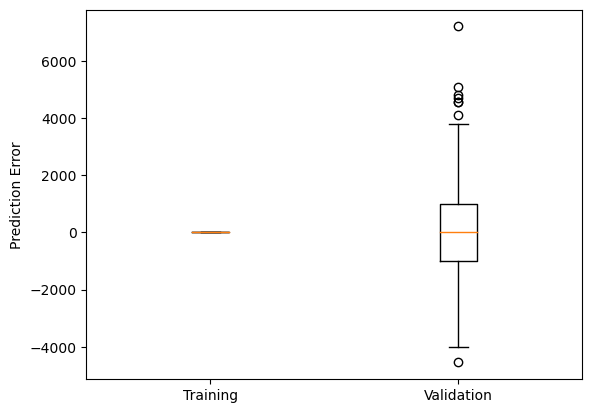

In [460]:
plt.boxplot([train_y - train_y_pred, valid_y - valid_y_pred], labels=["Training", "Validation"])
plt.ylabel("Prediction Error")
plt.show()

On comparing the errors of training and validation sets, we see that RMSE for the validation set is greater than the RMSE for the training. This is clearly visible in the box plots above. This occurs because the model is overfitting the training data. This means that the model is learning the specific patterns and noise in the training data, but fails to generalize to new and unseen data. As a result, the model makes larger errors on the validation set, which reflects its true performance. Thus predictive performance of validation set is greater than the predictive performance of a training set.

###### iii. How might we achieve better validation predictive performance at the expense of training performance?

One way to achieve better validation predictive performance at the expense of training performance is to use regularization techniques, such as pruning, setting the minimum number of samples required at a leaf node, or setting the maximum depth of the tree. These techniques can reduce the complexity of the model and prevent overfitting, but they may also increase the bias and decrease the accuracy on the training data.

Another way to improve validation predictive performance is to use cross-validation or bootstrap validation methods, which use different subsets of the data for model building and model assessment. These methods can provide more reliable estimates of the model’s performance on new data, but they may also increase the computational cost and complexity of the analysis.

###### iv. Create a smaller tree by using GridSearchCV() with cv = 5 to find a fine-tuned tree. Compared to the full-grown tree, what is the predictive performance on the validation set?

User grid search to find optimized tree.

In [461]:
param_grid = {
'max_depth': [2, 4, 6, 8, 10],
'min_impurity_decrease': [0, 0.001, 0.005, 0.01],
'min_samples_split': [10, 20, 30, 40, 50],
}

gridSearch = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Initial parameters: ', gridSearch.best_params_)

Initial parameters:  {'max_depth': 6, 'min_impurity_decrease': 0, 'min_samples_split': 20}


Improving parameters.

In [462]:
param_grid = {
'max_depth': [2, 3, 4, 5, 6],
'min_impurity_decrease': [0.001, 0.002, 0.003, 0.005, 0.006, 0.007, 0.008],
'min_samples_split': [20, 21, 22, 23, 24, 25],
}


gridSearch = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Improved parameters: ', gridSearch.best_params_)

Improved parameters:  {'max_depth': 6, 'min_impurity_decrease': 0.001, 'min_samples_split': 20}


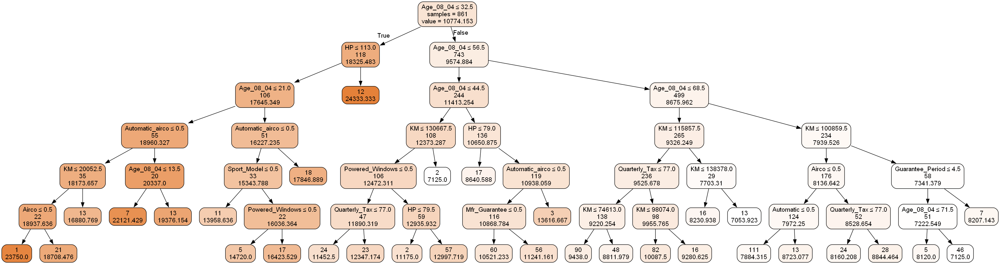

In [463]:
regTreeSmall = gridSearch.best_estimator_

plotDecisionTree(regTreeSmall, feature_names=train_X.columns)

In [464]:
regressionSummary(train_y, regTreeSmall.predict(train_X))
regressionSummary(valid_y, regTreeSmall.predict(valid_X))


Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 1082.6992
            Mean Absolute Error (MAE) : 786.5953
          Mean Percentage Error (MPE) : -0.9986
Mean Absolute Percentage Error (MAPE) : 7.6224

Regression statistics

                      Mean Error (ME) : 24.8976
       Root Mean Squared Error (RMSE) : 1251.3861
            Mean Absolute Error (MAE) : 958.1684
          Mean Percentage Error (MPE) : -1.0544
Mean Absolute Percentage Error (MAPE) : 9.5594


On the validation set, Root Mean Squared Error (RMSE) of full-grown tree is 1311.1948 whereas RMSE of smaller tree is 1251.3861, this means the predictive performance of smaller tree with improved parameters is better.

##### b. Let us see the effect of turning the price variable into a categorical variable. First, create a new variable that categorizes price into 20 bins. Now repartition the data keeping Binned_Price instead of Price. Run a classification tree with the same set of input variables as in the RT, and with Binned_Price as the output variable. As in the less deep regression tree, create a smaller tree by using GridSearchCV() with cv = 5 to find a fine-tuned tree.

Making a deep copy of the dataframe. 

In [465]:
df_cat_outcome = df.copy()

Converting price into a categorical variable.

In [466]:
min_price = df_cat_outcome['Price'].min()
max_price = df_cat_outcome['Price'].max()

print('Min Price: {}'.format(min_price))
print('Max Price: {}'.format(max_price))

Min Price: 4350
Max Price: 32500


In [467]:
bins = [4350, 5757.5, 7165, 8572.5, 9980, 11387.5, 12795, 14202.5, 15610, 17017.5, 18425, 19832.5, 21240, 22647.5, 24055, 25462.5, 26870, 28277.5, 29685, 31092.5, 32500]
labels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

In [468]:
df_cat_outcome['Binned_Price']= pd.cut(df_cat_outcome['Price'], bins=bins, labels=labels)
df_cat_outcome.head(1)

,Id,Model,Price,Age_08_04,Mfg_Month,Mfg_Year,KM,Fuel_Type,HP,Met_Color,Color,Automatic,CC,Doors,Cylinders,Gears,Quarterly_Tax,Weight,Mfr_Guarantee,BOVAG_Guarantee,Guarantee_Period,ABS,Airbag_1,Airbag_2,Airco,Automatic_airco,Boardcomputer,CD_Player,Central_Lock,Powered_Windows,Power_Steering,Radio,Mistlamps,Sport_Model,Backseat_Divider,Metallic_Rim,Radio_cassette,Parking_Assistant,Tow_Bar,Binned_Price
0,1,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13500,23,10,2002,46986,Diesel,90,1,Blue,0,2000,3,4,5,210,1165,0,1,3,1,1,1,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0,7


Converting Fuel_Type variable into categorical variable and separating input and output in X and y variables.

In [469]:
X = pd.get_dummies(df_cat_outcome[predictors], columns=['Fuel_Type'])
y = df_cat_outcome['Binned_Price']

X.head(1)

,Age_08_04,KM,HP,Automatic,Doors,Quarterly_Tax,Mfr_Guarantee,Guarantee_Period,Airco,Automatic_airco,CD_Player,Powered_Windows,Sport_Model,Tow_Bar,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,23,46986,90,0,3,210,0,3,0,0,0,1,0,0,0,1,0


Repartitioning the data into training(60%), and validation(40%) datasets.

In [470]:
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

Run a classification tree with the same set of input variables as in the RT, and with Binned_Price as the output variable.

In [471]:
classTreeFull = DecisionTreeClassifier()
classTreeFull.fit(train_X, train_y)

plotDecisionTree(classTreeFull, feature_names=train_X.columns)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.718118 to fit


User grid search to find optimized tree.

In [472]:
param_grid = {
'max_depth': [4, 8, 12, 16, 18],
'min_impurity_decrease': [0, 0.001, 0.005, 0.01],
'min_samples_split': [3, 6, 9, 12, 15, 18, 21, 24, 27, 30],
}

gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Initial parameters: ', gridSearch.best_params_)

C:\Users\Randhir\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Initial parameters:  {'max_depth': 8, 'min_impurity_decrease': 0, 'min_samples_split': 15}


Improving parameters.

In [473]:
param_grid = {
'max_depth': [2, 3, 4, 5, 6, 7, 8],
'min_impurity_decrease': [0, 0.001, 0.002, 0.003, 0.005, 0.006, 0.007, 0.008],
'min_samples_split': [15, 16, 17, 18, 19, 20],
}


gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Improved parameters: ', gridSearch.best_params_)

C:\Users\Randhir\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Improved parameters:  {'max_depth': 5, 'min_impurity_decrease': 0, 'min_samples_split': 16}


Running the regression tree with improved parameters.

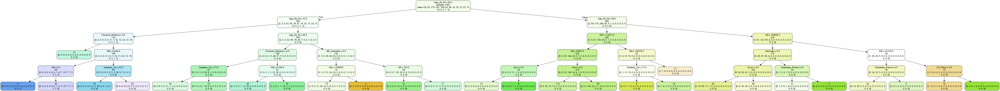

In [474]:
classTreeSmall = gridSearch.best_estimator_

plotDecisionTree(classTreeSmall, feature_names=train_X.columns)

Finding the top predictors.

In [475]:
importances = classTreeSmall.feature_importances_
dfImpClassTrSmall = pd.DataFrame({'feature': train_X.columns, 'importance': importances})
dfImpClassTrSmall = dfImpClassTrSmall.sort_values('importance', ascending=False)
print(dfImpClassTrSmall.head(3))

         feature  importance
0      Age_08_04    0.619156
1             KM    0.190106
5  Quarterly_Tax    0.043703


###### i. Compare the smaller tree generated by the CT with the smaller tree generated by RT. Are they different? (Look at structure, the top predictors, size of tree, etc.) Why?

Smaller tree generated by the CT is different from the RT in terms of structure, the top predictors and the size of the tree.  Structure of the smaller tree generated by CT is significantly different from the tree generated by RT. The classifications are very distinct with the smaller CT above. The top predictors are also very different. With RT the top predictors were Age_08_04, HP and KM whereas with CT it is Age_08_04, Km and Quarterly_Tax. The size of the smaller tree with RT is 8 wherease with CT it is 5. This is the effect of converting price variable to categorical variable. 

###### ii. Predict the price, using the smaller RT and CT, of a used Toyota Corolla with the specifications listed in Table 9.10.

In [476]:
prospect = pd.DataFrame([{'Age_08_04': 77, 
        'KM': 117000,
        'HP': 110, 
        'Automatic': 0, 
        'Doors': 5, 
        'Quarterly_Tax': 100, 
        'Mfr_Guarantee': 0, 
        'Guarantee_Period': 3, 
        'Airco': 0, 
        'Automatic_airco': 0, 
        'CD_Player': 0,
        'Powered_Windows': 0, 
        'Sport_Model': 0, 
        'Tow_Bar': 1,
        'Fuel_Type_CNG': 0,
        'Fuel_Type_Diesel': 0,
        'Fuel_Type_Petrol': 1}])

display(prospect)

,Age_08_04,KM,HP,Automatic,Doors,Quarterly_Tax,Mfr_Guarantee,Guarantee_Period,Airco,Automatic_airco,CD_Player,Powered_Windows,Sport_Model,Tow_Bar,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,77,117000,110,0,5,100,0,3,0,0,0,0,0,1,0,0,1


Converting categorical variable of prospect data to numerical variable.

In [477]:
prospect = pd.get_dummies(prospect)

Predicting the price using the smaller regresssion tree(RT).

In [478]:
pred_regTreeSmall_Price = regTreeSmall.predict(prospect)
print(pred_regTreeSmall_Price)

[7125.]


Predicting the price using the smaller classification tree(CT).

In [479]:
pred_classTreeSmall_Price = classTreeSmall.predict(prospect)
print(pred_classTreeSmall_Price)

[3]


Above price bin = 3 corresponds to price range of 7165 to 8572.5.

###### iii. Compare the predictions in terms of the predictors that were used, the magnitude of the difference between the two predictions, and the advantages and disadvantages of the two methods.

In the predictions above, smaller regression tree used numerical output varialbe whereas small classification tree used categorical output variable. The price predictions are different by a small amount. Regression tree predicted price as 7125, whereas classification tree predicted price in the range of 7165 to 8572.5, which is different by a small amount.

There are several Advantages of using continuous value for output during RT. It can handle non-linear relationships between the input and output variables, as the decision tree can create complex rules and splits based on the data features. It can combine features to make predictions, as the decision tree can use multiple if-else conditions on different features to reach a leaf node with a predicted value. It can be robust to outliers, as the decision tree uses an aggregation function (such as mean) to compute the output value for each leaf node, which can reduce the impact of extreme values.

Likewise, using continuous value for output during RT also has several disadvantages. It can be prone to overfitting, as the decision tree can create over-complex trees that do not generalize well to new data. This can be mitigated by using regularization techniques, such as pruning, setting the minimum number of samples required at a leaf node, or setting the maximum depth of the tree. It can be unstable to changes in the data, as small variations in the data can result in a completely different tree being generated. This can be mitigated by using decision trees within an ensemble, such as random forest or gradient boosting. It can be non-continuous, as the decision tree produces piecewise constant approximations of the output variable, which are not smooth or continuous. This means that the decision tree is not good at extrapolation, or predicting values outside the range of the training data.

Advantage of categorizing the output variable during CT is that it can make the interpretation of the results easier and more intuitive. The decision tree classifier produces a tree-like structure that shows the rules and conditions for each split and the corresponding class labels for each leaf node. Visualizatin of the tree shows how the output variable is classified based on the input features. This can help us understand the logic and the importance of the features in the classification task.

One of the disadvantages of categorizing the output variable while classifying using sklearn.tree.DecisionTreeClassifier is that it may not handle categorical data correctly. The sklearn decision tree classifier expects the input and output variables to be numerical, so we need to encode the categorical variables as integers or binary vectors. However, this may introduce some problems, such as, it will impose an artificial order on the categories that may not reflect their true relationship. For example, if we encode [‘red’, ‘green’, ‘blue’] as [0, 1, 2], the classifier may assume that ‘red’ is closer to ‘green’ than to ‘blue’, which may not be true for our problem domain. It can create splits that do not make sense or are not optimal. For example, if we encode [‘low’, ‘medium’, ‘high’] as [0, 1, 2], the classifier may split the data at 0.5 or 1.5, which are not meaningful thresholds for the categories. A better split would be at 0 or 1, which separate the categories clearly. It will also increase the dimensionality and sparsity of the data. If we use one-hot encoding to convert categorical variables into binary vectors, we will end up with a large number of features, many of which are zero. This may affect the performance and interpretability of the classifier.